# **Topic Modeling with Llama3** 🦙
*Create easily interpretable topics with BERTopic and Llama 3*
<br>

We will explore how we can use Llama3 for Topic Modeling without the need to pass every single document to the model. Instead, we are going to leverage BERTopic, a modular topic modeling technique that can use any LLM for fine-tuning topic representations.

BERTopic works rather straightforward. It consists of 5 sequential steps: embedding documents, reducing embeddings in dimensionality, cluster embeddings, tokenize documents per cluster, and finally extract the best representing words per topic.
<br>
<div>
<img src="https://github.com/MaartenGr/BERTopic/assets/25746895/e9b0d8cf-2e19-4bf1-beb4-4ff2d9fa5e2d" width="500"/>
</div>

However, with the rise of LLMs like **Llama 3**, we can do much better than a bunch of independent words per topic. It is computally not feasible to pass all documents to Llama 3 directly and have it analyze them. We can employ vector databases for search but we are not entirely search which topics to search for.

Instead, we will leverage the clusters and topics that were created by BERTopic and have Llama 3 fine-tune and distill that information into something more accurate.

This is the best of both worlds, the topic creation of BERTopic together with the topic representation of Llama 3.
<br>
<div>
<img src="https://github.com/MaartenGr/BERTopic/assets/25746895/7c7374a1-5b41-4e93-aafd-a1587367767b" width="500"/>
</div>

Now that this intro is out of the way, let's start the hands-on tutorial!

---
        
💡 **NOTE**: We will want to use a GPU to run both Llama2 as well as BERTopic for this use case. In Google Colab, go to
**Runtime > Change runtime type > Hardware accelerator > GPU > GPU type > T4**.

---

We will start by installing a number of packages that we are going to use throughout this example:

In [ ]:
%%capture
!pip install bertopic datasets accelerate bitsandbytes xformers adjustText

# 📄 **Data**

We are going to apply topic modeling on a number of ArXiv abstracts. They are a great source for topic modeling since they contain a wide variety of topics and are generally well-written.

In [ ]:
from datasets import load_dataset
dataset = load_dataset("aalksii/ml-arxiv-papers", split="train")

# Extract abstracts to train on and corresponding titles
abstracts = dataset["abstract"]
titles = dataset["title"]

Generating train split:   0%|          | 0/105832 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/11760 [00:00<?, ? examples/s]

To give you an idea, an abstract looks like the following:

In [ ]:
# The abstract of "Attention Is All You Need"
print(abstracts[13894])

We give a algorithm for exact sampling from the Bingham distribution $p(x)\propto \exp(x^\top A x)$ on the sphere $\mathcal S^{d-1}$ with expected runtime of $\operatorname{poly}(d, \lambda_{\max}(A)-\lambda_{\min}(A))$. The algorithm is based on rejection sampling, where the proposal distribution is a polynomial approximation of the pdf, and can be sampled from by explicitly evaluating integrals of polynomials over the sphere. Our algorithm gives exact samples, assuming exact computation of an inverse function of a polynomial. This is in contrast with Markov Chain Monte Carlo algorithms, which are not known to enjoy rapid mixing on this problem, and only give approximate samples.   As a direct application, we use this to sample from the posterior distribution of a rank-1 matrix inference problem in polynomial time.


In [ ]:
len(abstracts)

105832

In [ ]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) n
Token is valid (permission: read).
Your token has been saved to /root/.cache/huggingface/token
Login successful


# 🦙 **Llama 3**

Now comes one of the more interesting components of this tutorial, how to load in a Llama 3 model on a T4-GPU!

We will be focusing on the `'m-polignano-uniba/LLaMAntino-3-ANITA-8B-Inst-DPO-ITA'` variant. It is large enough to give interesting and useful results whilst small enough that it can be run on our environment.

We start by defining our model and identifying if our GPU is correctly selected. We expect the output of `device` to show a cuda device:

In [ ]:
import torch
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    BitsAndBytesConfig,
)

base_model = "m-polignano-uniba/LLaMAntino-3-ANITA-8B-Inst-DPO-ITA"
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
    bnb_4bit_use_double_quant=False,
)
model = AutoModelForCausalLM.from_pretrained(
    base_model,
    quantization_config=bnb_config,
    device_map="auto",
)
tokenizer = AutoTokenizer.from_pretrained(base_model)



config.json:   0%|          | 0.00/757 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

model-00001-of-00007.safetensors:   0%|          | 0.00/4.94G [00:00<?, ?B/s]

model-00002-of-00007.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00003-of-00007.safetensors:   0%|          | 0.00/4.83G [00:00<?, ?B/s]

model-00004-of-00007.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00005-of-00007.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00006-of-00007.safetensors:   0%|          | 0.00/4.19G [00:00<?, ?B/s]

model-00007-of-00007.safetensors:   0%|          | 0.00/1.05G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/130 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/50.9k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/301 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
from torch import cuda

model_id = "m-polignano-uniba/LLaMAntino-3-ANITA_test"
device = f'cuda:{cuda.current_device()}' if cuda.is_available() else 'cpu'

print(device)

cuda:0


Using the model and tokenizer, we will generate a HuggingFace transformers pipeline that allows us to easily generate new text:

In [ ]:
# Our text generator
import transformers
model.eval()
generator = transformers.pipeline(
    model=model, tokenizer=tokenizer,
    task='text-generation',
    temperature=0.1,
    max_new_tokens=500,
    repetition_penalty=1.1
)

## **Prompt Engineering**

To check whether our model is correctly loaded, let's try it out with a few prompts.

In [ ]:
prompt = "Could you explain to me how 4-bit quantization works as if I am 5?"
res = generator(prompt)
print(res[0]["generated_text"])

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:492: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.1` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Could you explain to me how 4-bit quantization works as if I am 5? 


### **Prompt Template**

We are going to keep our `system prompt` simple and to the point:

In [ ]:
prompt = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>

You are a helpful, respectful and honest assistant for labeling topics. <|eot_id|> <|start_header_id|>user<|end_header_id|>

I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the information about the topic above, please create a short label of this topic. Make sure you to only return the label and nothing more.

 <|eot_id|> <|start_header_id|>assistant<|end_header_id|>


"""

There are two BERTopic-specific tags that are of interest, namely `[DOCUMENTS]` and `[KEYWORDS]`:

* `[DOCUMENTS]` contain the top 5 most relevant documents to the topic
* `[KEYWORDS]` contain the top 10 most relevant keywords to the topic as generated through c-TF-IDF

This template will be filled accordingly to each topic. And finally, we can combine this into our final prompt:

# 🗨️ **BERTopic**

Before we can start with topic modeling, we will first need to perform two steps:
* Pre-calculating Embeddings
* Defining Sub-models

## **Preparing Embeddings**

By pre-calculating the embeddings for each document, we can speed-up additional exploration steps and use the embeddings to quickly iterate over BERTopic's hyperparameters if needed.

🔥 **TIP**: You can find a great overview of good embeddings for clustering on the [MTEB Leaderboard](https://huggingface.co/spaces/mteb/leaderboard).

In [ ]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/90.8k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/684 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/366 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/3308 [00:00<?, ?it/s]

## **Sub-models**

Next, we will define all sub-models in BERTopic and do some small tweaks to the number of clusters to be created, setting random states, etc.

In [ ]:
from umap import UMAP
from hdbscan import HDBSCAN

umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

As a small bonus, we are going to reduce the embeddings we created before to 2-dimensions so that we can use them for visualization purposes when we have created our topics.

In [ ]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


### **Representation Models**

One of the ways we are going to represent the topics is with Llama 3 which should give us a nice label. However, we might want to have additional representations to view a topic from multiple angles.

Here, we will be using c-TF-IDF as our main representation and [KeyBERT](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#keybertinspired), [MMR](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#maximalmarginalrelevance), and [Llama 3](https://maartengr.github.io/BERTopic/getting_started/representation/llm.html) as our additional representations.

In [ ]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity=0.3)

# Text generation with Llama 3
llama3 = TextGeneration(generator, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert,
    "Llama3": llama3,
    "MMR": mmr,
}

# 🔥 **Training**

Now that we have our models prepared, we can start training our topic model! We supply BERTopic with the sub-models of interest, run `.fit_transform`, and see what kind of topics we get.

In [ ]:
from bertopic import BERTopic

topic_model = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(abstracts, embeddings)

2024-04-30 13:28:51,126 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-04-30 13:31:24,383 - BERTopic - Dimensionality - Completed ✓
2024-04-30 13:31:24,387 - BERTopic - Cluster - Start clustering the reduced embeddings
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
2024-04-30 13:31:42,984 - BERTopic - Cluster - Completed ✓
2024-04-30 13:31:43,027 - BERTopic - Representation - Extracting topics from clusters using representation models.
  8%|▊         | 9/115 [01:53<14:59,  8.48s/it]You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.
100%|██████████| 115/115 [19:15<00:00, 10.05s/it]
2024-04-30 13:51:41,927 - BERTopi

Now that we are done training our model, let's see what topics were generated:

In [ ]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,Llama3,MMR,Representative_Docs
0,-1,33101,-1_the_of_and_to,"[the, of, and, to, in, we, for, is, that, on]","[models, model, algorithms, datasets, algorith...",[Matrix valued data\n0. Matrix valued data has...,"[the, of, and, to, in, we, for, is, that, on]",[Zero-shot learning (ZSL) can be defined by co...
1,0,9420,0_policy_reinforcement_rl_agent,"[policy, reinforcement, rl, agent, learning, c...","[dynamics, learning, robots, reinforcement, mo...",[Topic: Model-based reinforcement learning (RL...,"[policy, reinforcement, rl, agent, learning, c...",[Developing agents that can perform challengin...
2,1,3120,1_speech_audio_speaker_music,"[speech, audio, speaker, music, asr, recogniti...","[encoder, speech, language, trained, supervise...",[Topic: Automatic Speech Recognition and Synth...,"[speech, audio, speaker, music, asr, recogniti...",[Speaker recognition is a well known and studi...
3,2,1967,2_adversarial_attacks_robustness_attack,"[adversarial, attacks, robustness, attack, exa...","[adversarial, adversarially, dnns, dnn, imagen...",[Topic: Statistical characterization of advers...,"[adversarial, attacks, robustness, attack, exa...",[Deep Neural Networks (DNNs) have recently led...
4,3,1858,3_equations_differential_physics_neural,"[equations, differential, physics, neural, pde...","[pdes, modeling, pde, dynamics, models, comput...",[Topic: Machine Learning Methods for Discoveri...,"[equations, differential, physics, neural, pde...","[In recent years, deep learning has proven to ..."
...,...,...,...,...,...,...,...,...
110,109,172,109_equivariant_symmetry_group_equivariance,"[equivariant, symmetry, group, equivariance, s...","[equivariances, equivariance, equivariant, con...",[Topic: Equivariant Models for Transformations...,"[equivariant, symmetry, group, equivariance, s...",[State-of-the-art deep learning systems often ...
111,110,170,110_oct_retinal_dr_diabetic,"[oct, retinal, dr, diabetic, glaucoma, fundus,...","[retinal, ophthalmologists, retina, fovea, oph...",[The topic is related to the use of deep learn...,"[oct, retinal, dr, diabetic, glaucoma, fundus,...",[Optical coherence tomography (OCT) is a non-i...
112,111,168,111_graphical_ising_belief_propagation,"[graphical, ising, belief, propagation, bp, be...","[graphs, approximation, graph, algorithms, nod...",[Label: Graphical Models and Belief Propagatio...,"[graphical, ising, belief, propagation, bp, be...",[Factor graphs are important models for succin...
113,112,164,112_mri_reconstruction_pet_imaging,"[mri, reconstruction, pet, imaging, mr, image,...","[mri, imaging, undersampling, undersampled, co...",[Topic: MRI Reconstruction Methods \n\nLabel: ...,"[mri, reconstruction, pet, imaging, mr, image,...",[Deep learning methods have been successfully ...


In [ ]:
topic_model.get_topic(1, full=True)["KeyBERT"]

[('encoder', 0.86116934),
 ('speech', 0.85024667),
 ('language', 0.8469707),
 ('trained', 0.8455125),
 ('supervised', 0.8452209),
 ('voice', 0.8435067),
 ('models', 0.84348774),
 ('model', 0.8420342),
 ('neural', 0.83622026),
 ('representations', 0.8351065)]

We got over 100 topics that were created and they all seem quite diverse.We can use the labels by Llama 3 and assign them to topics that we have created. Normally, the default topic representation would be c-TF-IDF, but we will focus on Llama 3 representations instead.


In [ ]:
llama3_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["Llama3"].values()]
topic_model.set_topic_labels(llama3_labels)

# 📊 **Visualize**
We can go through each topic manually, which would take a lot of work, or we can visualize them all in a single interactive graph.
BERTopic has a bunch of [visualization functions](https://medium.com/r/?url=https%3A%2F%2Fmaartengr.github.io%2FBERTopic%2Fgetting_started%2Fvisualization%2Fvisualize_documents.html) that we can use. For now, we are sticking with visualizing the documents.

In [ ]:
topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

# 🖼️ (BONUS): **Advanced Visualization**

Although we can use the built-in visualization features of BERTopic, we can also create a static visualization that might be a bit more informative.

We start by creating the necessary variables that contain our reduced embeddings and representations:

In [25]:
import itertools
import pandas as pd

# Define colors for the visualization to iterate over
colors = itertools.cycle(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
color_key = {str(topic): next(colors) for topic in set(topic_model.topics_) if topic != -1}

# Prepare dataframe and ignore outliers
df = pd.DataFrame({"x": reduced_embeddings[:, 0], "y": reduced_embeddings[:, 1], "Topic": [str(t) for t in topic_model.topics_]})
df["Length"] = [len(doc) for doc in abstracts]
df = df.loc[df.Topic != "-1"]
df = df.loc[(df.y > -10) & (df.y < 10) & (df.x < 10) & (df.x > -10), :]
df["Topic"] = df["Topic"].astype("category")

# Get centroids of clusters
mean_df = df.groupby("Topic").mean().reset_index()
mean_df.Topic = mean_df.Topic.astype(int)
mean_df = mean_df.sort_values("Topic")

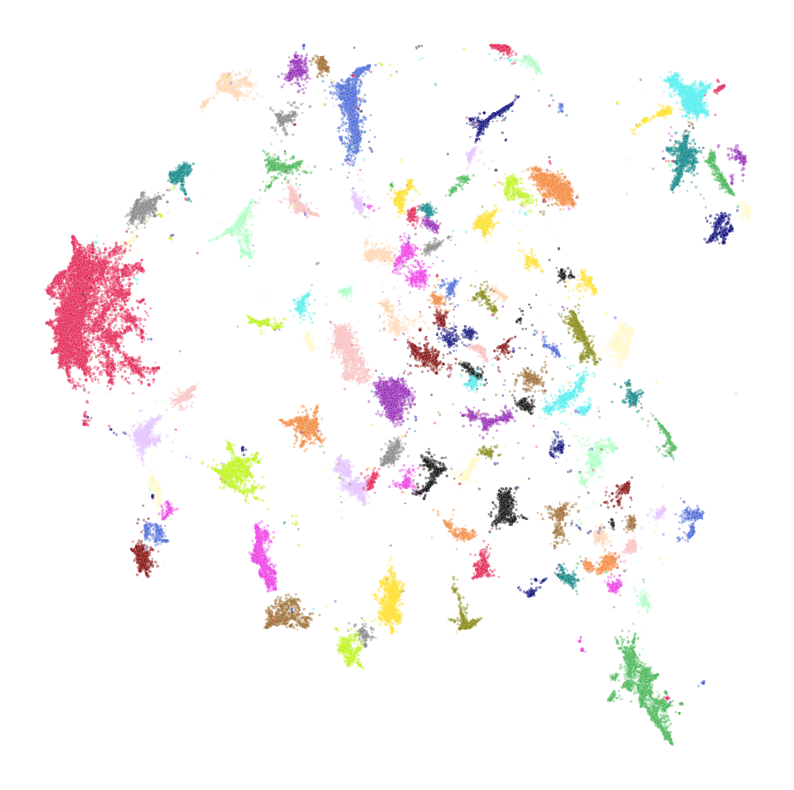

In [30]:
import seaborn as sns
from matplotlib import pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
import textwrap

fig = plt.figure(figsize=(10, 10))
try:
  sns.scatterplot(data=df, x='x', y='y', c=df['Topic'].map(color_key), alpha=0.4, sizes=(0.4, 10), size="Length")
except:
  pass
# Annotate top 50 topics
texts, xs, ys = [], [], []
for row in mean_df.iterrows():
  topic = row[1]["Topic"]
  name = textwrap.fill(topic_model.custom_labels_[int(topic)], 20)

  if int(topic) <= 50:
    xs.append(row[1]["x"])
    ys.append(row[1]["y"])
    texts.append(plt.text(row[1]["x"], row[1]["y"], '', size=10, ha="center", color=color_key[str(int(topic))],
                          path_effects=[pe.withStroke(linewidth=0.5, foreground="black")]
                          ))

# Adjust annotations such that they do not overlap
adjust_text(texts, x=xs, y=ys, time_lim=1, force_text=(0.01, 0.02), force_static=(0.01, 0.02), force_pull=(0.5, 0.5))
plt.axis('off')
plt.legend('', frameon=False)
plt.show()

# Backup Saving

In [31]:
# To save: model, reduced embeddings, representative docs
!pip install safetensors

In [32]:
import pickle

with open('rep_docs.pickle', 'wb') as handle:
    pickle.dump(topic_model.representative_docs_, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('reduced_embeddings.pickle', 'wb') as handle:
    pickle.dump(reduced_embeddings, handle, protocol=pickle.HIGHEST_PROTOCOL)

# with open('filename.pickle', 'rb') as handle:
#     b = pickle.load(handle)

In [33]:
embedding_model = "BAAI/bge-small-en"
topic_model.save("final", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

In [34]:
!zip -r /content/llama3.zip /content/final

  adding: content/final/ (stored 0%)
  adding: content/final/ctfidf_config.json (deflated 65%)
  adding: content/final/topics.json (deflated 83%)
  adding: content/final/ctfidf.safetensors (deflated 48%)
  adding: content/final/topic_embeddings.safetensors (deflated 7%)
  adding: content/final/config.json (deflated 42%)
